## Análise Exploratória de Dados

In [1]:
#Importações

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from Apoio.config import DADOS_ORIGINAIS, DADOS_LIMPOS
from Apoio.graficos import SCATTER_ALPHA, PALETTE

import warnings
warnings.filterwarnings("ignore")

#### Checagens básicas

In [2]:
df = pd.read_csv(DADOS_ORIGINAIS, compression="zip")
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [3]:
df.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [5]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [6]:
df.describe(exclude="number")

,ocean_proximity
count,20640
unique,5
top,<1H OCEAN
freq,9136


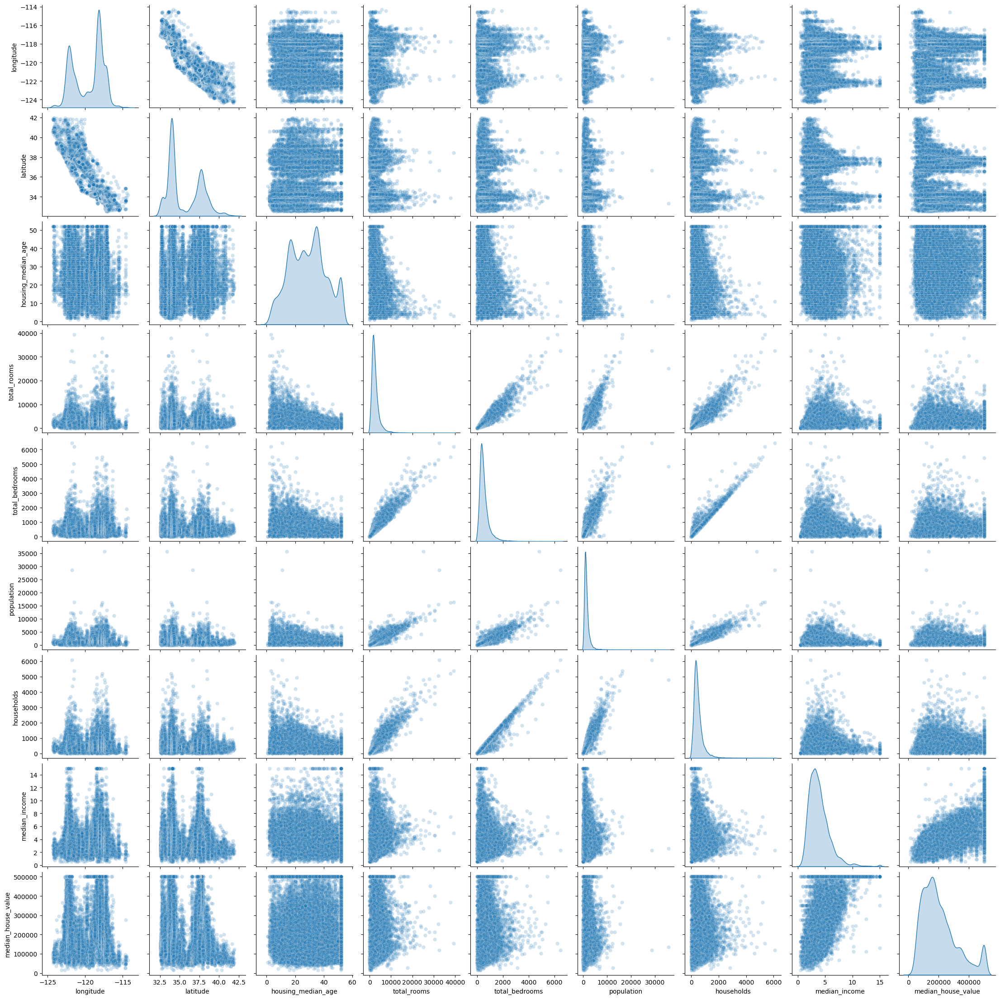

In [7]:
sns.pairplot(df, diag_kind="kde", plot_kws=dict(alpha=SCATTER_ALPHA))

- Podemos observar algumas **correlações positivas**, como em **total_rooms** e **total_bedrooms**. Isso é de se esperar, visto que quanto mais quartos no total, mais quartos de dormir você espera.
- Por outro lado, observa-se **correlações negativas**, como em **latitude** e **longitude**, visto que elas não têm relação causal. Elas só representam posição geográfica.
- Na diagonal **KDE**, nota-se algumas assimetrias (cauda longa à direita), como em **total_rooms**, **population**, **etc.**, já outras parecem mais “normais”, mas ainda com distorções. Isso é um sinal de Dados com outliers.
- Em algumas relações, você vê linhas verticais ou horizontais. Isso indica que há valores repetidos ou discretização, como arredondamento.

In [8]:
df.select_dtypes("number").skew()

longitude            -0.297801
latitude              0.465953
housing_median_age    0.060331
total_rooms           4.147343
total_bedrooms        3.459546
population            4.935858
households            3.410438
median_income         1.646657
median_house_value    0.977763
dtype: float64

**Skew** mede se a distribuição é “torta” para um lado (assimetria).
- Skew = 0 (simétrica) -> Distribuição equilibrada dos dois lados
- Skew positivo (assimetria à direita) -> Muitos valores baixos, poucos valores muito altos
- Skew negativo (assimetria à esquerda) -> Muitos valores altos, poucos valores muito baixos

In [9]:
df.select_dtypes("number").kurtosis()

longitude             -1.330152
latitude              -1.117760
housing_median_age    -0.800629
total_rooms           32.630927
total_bedrooms        21.985575
population            73.553116
households            22.057988
median_income          4.952524
median_house_value     0.327870
dtype: float64

**Kurtosis** mede o “formato do pico” e das caudas da distribuição, ou seja, se os dados têm muitos outliers ou não.
- Kurtosis normal (mesocúrtica) -> Parecida com a normal
- Kurtosis alta (leptocúrtica) -> Pico mais alto, caudas mais pesadas (mais outliers)
- Kurtosis baixa (platicúrtica) -> Mais “achatada”, menos outliers

#### Vendo se há colunas nulas

In [10]:
df[df.isnull().any(axis=1)]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
290,-122.16,37.77,47.0,1256.0,NaN,570.0,218.0,4.3750,161900.0,NEAR BAY
341,-122.17,37.75,38.0,992.0,NaN,732.0,259.0,1.6196,85100.0,NEAR BAY
538,-122.28,37.78,29.0,5154.0,NaN,3741.0,1273.0,2.5762,173400.0,NEAR BAY
563,-122.24,37.75,45.0,891.0,NaN,384.0,146.0,4.9489,247100.0,NEAR BAY
696,-122.10,37.69,41.0,746.0,NaN,387.0,161.0,3.9063,178400.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20267,-119.19,34.20,18.0,3620.0,NaN,3171.0,779.0,3.3409,220500.0,NEAR OCEAN
20268,-119.18,34.19,19.0,2393.0,NaN,1938.0,762.0,1.6953,167400.0,NEAR OCEAN
20372,-118.88,34.17,15.0,4260.0,NaN,1701.0,669.0,5.1033,410700.0,<1H OCEAN
20460,-118.75,34.29,17.0,5512.0,NaN,2734.0,814.0,6.6073,258100.0,<1H OCEAN


#### Boxplots

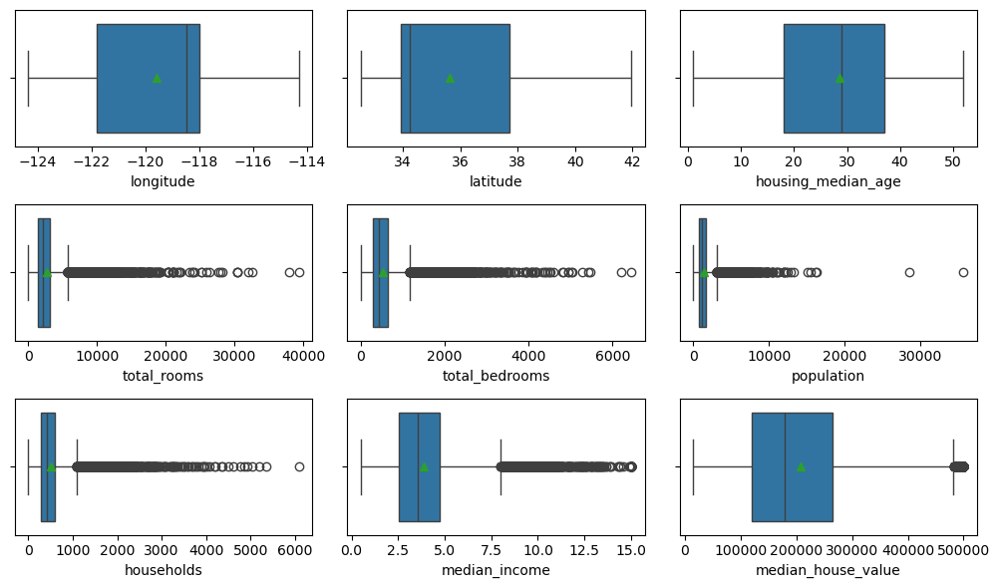

In [11]:
fig, axs = plt.subplots(3, 3, figsize=(10, 6))

for ax, coluna in zip(axs.flatten(), df.columns):
    sns.boxplot(data=df, x=coluna, ax=ax, showmeans=True)

plt.tight_layout()

plt.show()

#### Mapa de calor com correlação

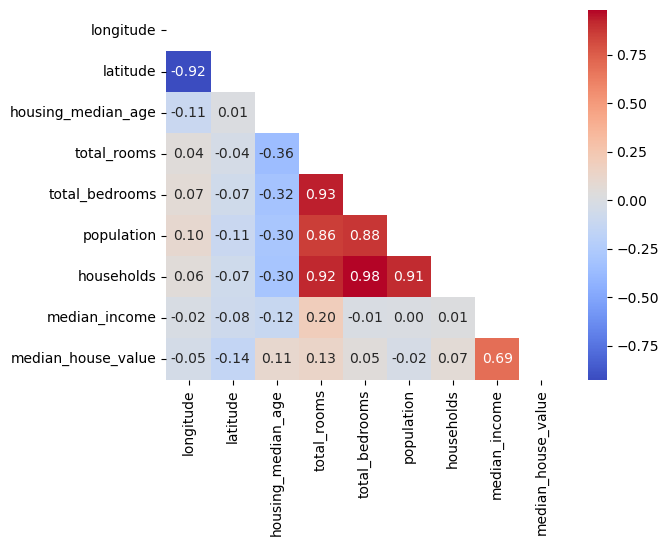

In [12]:
matriz = np.triu(df.select_dtypes("number").corr())

fig, ax = plt.subplots()

sns.heatmap(data=df.select_dtypes("number").corr(), cmap=PALETTE, annot=True, fmt=".2f", mask=matriz, ax=ax)

plt.show()

Criando novas colunas: 
- median_income_cat (Renda média categórica)
- rooms_per_household (Cômodos por domicílio)
- population_per_household (Pessoas por domicílio)
- bedrooms_per_room (quartos por cômodos)

In [13]:
df["median_income_cat"] = pd.cut(df["median_income"], bins=[0, 1.5, 3, 4.5, 6, np.inf], labels=[1, 2, 3, 4, 5])

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   longitude           20640 non-null  float64 
 1   latitude            20640 non-null  float64 
 2   housing_median_age  20640 non-null  float64 
 3   total_rooms         20640 non-null  float64 
 4   total_bedrooms      20433 non-null  float64 
 5   population          20640 non-null  float64 
 6   households          20640 non-null  float64 
 7   median_income       20640 non-null  float64 
 8   median_house_value  20640 non-null  float64 
 9   ocean_proximity     20640 non-null  object  
 10  median_income_cat   20640 non-null  category
dtypes: category(1), float64(9), object(1)
memory usage: 1.6+ MB


<Axes: xlabel='median_income_cat'>

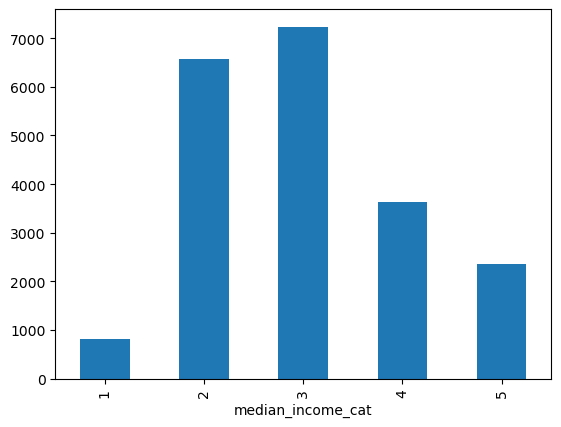

In [15]:
df["median_income_cat"].value_counts().sort_index().plot(kind="bar")

In [16]:
df["rooms_per_household"] = df["total_rooms"] / df["households"]
df["population_per_household"] = df["population"] / df["households"]
df["bedrooms_per_room"] = df["total_bedrooms"] / df["total_rooms"]

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 20640 non-null  float64 
 1   latitude                  20640 non-null  float64 
 2   housing_median_age        20640 non-null  float64 
 3   total_rooms               20640 non-null  float64 
 4   total_bedrooms            20433 non-null  float64 
 5   population                20640 non-null  float64 
 6   households                20640 non-null  float64 
 7   median_income             20640 non-null  float64 
 8   median_house_value        20640 non-null  float64 
 9   ocean_proximity           20640 non-null  object  
 10  median_income_cat         20640 non-null  category
 11  rooms_per_household       20640 non-null  float64 
 12  population_per_household  20640 non-null  float64 
 13  bedrooms_per_room         20433 non-null  floa

#### Refazendo o os boxplots com a base atualizada

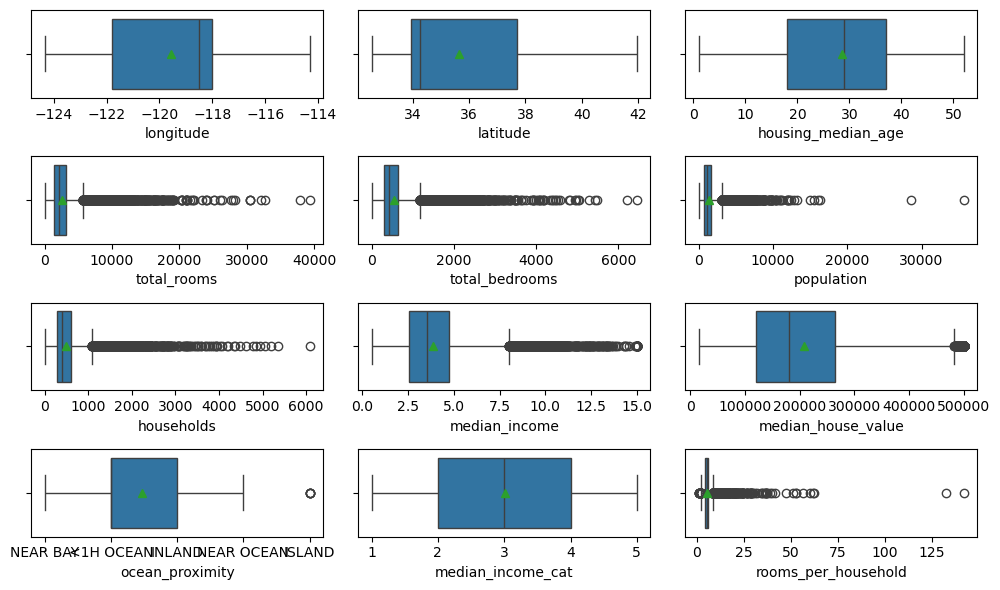

In [18]:
fig, axs = plt.subplots(4, 3, figsize=(10, 6))

for ax, coluna in zip(axs.flatten(), df.columns):
    sns.boxplot(data=df, x=coluna, ax=ax, showmeans=True)

plt.tight_layout()

plt.show()

#### Mapa de calor com correlação da base atualizada

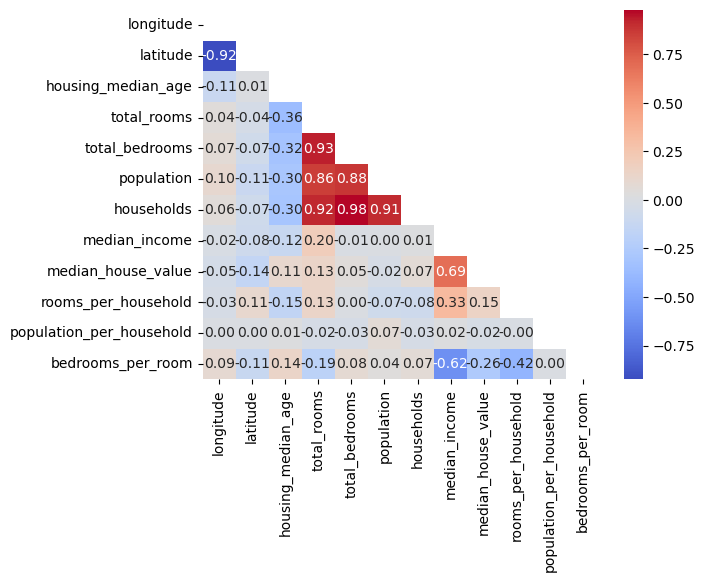

In [19]:
matriz = np.triu(df.select_dtypes("number").corr())

fig, ax = plt.subplots()

sns.heatmap(data=df.select_dtypes("number").corr(), cmap=PALETTE, annot=True, fmt=".2f", mask=matriz, ax=ax)

plt.show()

In [20]:
df[df["median_house_value"] == df["median_house_value"].max()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,median_income_cat,rooms_per_household,population_per_household,bedrooms_per_room
89,-122.27,37.80,52.0,249.0,78.0,396.0,85.0,1.2434,500001.0,NEAR BAY,1,2.929412,4.658824,0.313253
459,-122.25,37.87,52.0,609.0,236.0,1349.0,250.0,1.1696,500001.0,NEAR BAY,1,2.436000,5.396000,0.387521
493,-122.24,37.86,52.0,1668.0,225.0,517.0,214.0,7.8521,500001.0,NEAR BAY,5,7.794393,2.415888,0.134892
494,-122.24,37.85,52.0,3726.0,474.0,1366.0,496.0,9.3959,500001.0,NEAR BAY,5,7.512097,2.754032,0.127214
509,-122.23,37.83,52.0,2990.0,379.0,947.0,361.0,7.8772,500001.0,NEAR BAY,5,8.282548,2.623269,0.126756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20422,-118.90,34.14,35.0,1503.0,263.0,576.0,216.0,5.1457,500001.0,<1H OCEAN,4,6.958333,2.666667,0.174983
20426,-118.69,34.18,11.0,1177.0,138.0,415.0,119.0,10.0472,500001.0,<1H OCEAN,5,9.890756,3.487395,0.117247
20427,-118.80,34.19,4.0,15572.0,2222.0,5495.0,2152.0,8.6499,500001.0,<1H OCEAN,5,7.236059,2.553439,0.142692
20436,-118.69,34.21,10.0,3663.0,409.0,1179.0,371.0,12.5420,500001.0,<1H OCEAN,5,9.873315,3.177898,0.111657


Fazendo o filtro no Dataframe, para poder ver os valores máximos da coluna **median_house_value**, notamos algo estranho.

Há um teto artificial, que no caso é o valor 500001.0. Isso significa que valores foram capados (censurados), casas que valiam mais que isso foram “cortadas” no limite.

**Isso afeta o modelo em que sentido?**
O modelo acha que o valor máximo real é 500k, mas na verdade pode ser maior. Isso pode distorcer previsões.
Vamos tratar disso, mais adiante.

#### Vamos criar uma cópia do Dataframe, para resolver o problema acima. A cópia é feita, pois sempre podemos voltar ao originial, caso algo dê errado ou não saia como planejado.

In [21]:
df_clean = df.copy()

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 20640 non-null  float64 
 1   latitude                  20640 non-null  float64 
 2   housing_median_age        20640 non-null  float64 
 3   total_rooms               20640 non-null  float64 
 4   total_bedrooms            20433 non-null  float64 
 5   population                20640 non-null  float64 
 6   households                20640 non-null  float64 
 7   median_income             20640 non-null  float64 
 8   median_house_value        20640 non-null  float64 
 9   ocean_proximity           20640 non-null  object  
 10  median_income_cat         20640 non-null  category
 11  rooms_per_household       20640 non-null  float64 
 12  population_per_household  20640 non-null  float64 
 13  bedrooms_per_room         20433 non-null  floa

In [22]:
QUANTIL = 0.99

df_clean = df_clean[
    (df["housing_median_age"] < df["housing_median_age"].quantile(QUANTIL))
    & (df["total_rooms"] < df["total_rooms"].quantile(QUANTIL))
    & (df["total_bedrooms"] < df["total_bedrooms"].quantile(QUANTIL))
    & (df["population"] < df["population"].quantile(QUANTIL))
    & (df["households"] < df["households"].quantile(QUANTIL))
    & (df["median_income"] < df["median_income"].quantile(QUANTIL))
    & (df["median_house_value"] < df["median_house_value"].quantile(QUANTIL))
    & (df["rooms_per_household"] < df["rooms_per_household"].quantile(QUANTIL))
    & (df["population_per_household"] < df["population_per_household"].quantile(QUANTIL))
    & (df["bedrooms_per_room"] < df["bedrooms_per_room"].quantile(QUANTIL))
]

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17566 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17566 non-null  float64 
 1   latitude                  17566 non-null  float64 
 2   housing_median_age        17566 non-null  float64 
 3   total_rooms               17566 non-null  float64 
 4   total_bedrooms            17566 non-null  float64 
 5   population                17566 non-null  float64 
 6   households                17566 non-null  float64 
 7   median_income             17566 non-null  float64 
 8   median_house_value        17566 non-null  float64 
 9   ocean_proximity           17566 non-null  object  
 10  median_income_cat         17566 non-null  category
 11  rooms_per_household       17566 non-null  float64 
 12  population_per_household  17566 non-null  float64 
 13  bedrooms_per_room         17566 non-null  float64 


Aqui, cortamos os outliers altos, removendo registros com valores extremos em qualquer variável.

Isso será útil para melhorar o treino do modelo, que será feito em outro Notebook.

In [23]:
df_clean.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,rooms_per_household,population_per_household,bedrooms_per_room
count,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000,17566.000000
mean,-119.509858,35.601950,27.276955,2510.361152,515.361209,1386.223557,483.953034,3.696453,189591.204486,5.253849,2.934597,0.211654
std,1.984173,2.147246,11.323320,1593.957111,320.838680,844.886263,295.554440,1.541904,95988.907554,1.134053,0.691400,0.048323
min,-124.300000,32.540000,1.000000,6.000000,2.000000,3.000000,2.000000,0.499900,14999.000000,1.714286,0.750000,0.113535
25%,-121.600000,33.920000,18.000000,1464.250000,300.000000,816.000000,287.000000,2.547325,114300.000000,4.446441,2.470168,0.176919
50%,-118.460000,34.240000,28.000000,2131.000000,438.000000,1196.000000,415.000000,3.479200,171400.000000,5.205218,2.852579,0.203474
75%,-117.980000,37.670000,36.000000,3124.000000,643.000000,1738.000000,605.000000,4.622150,243800.000000,5.960973,3.306344,0.239171
max,-114.550000,41.950000,51.000000,11026.000000,2205.000000,5804.000000,1979.000000,10.594100,500000.000000,10.352941,5.392954,0.406295


#### Fazendo um pairplot do novo dataframe (df_clean)

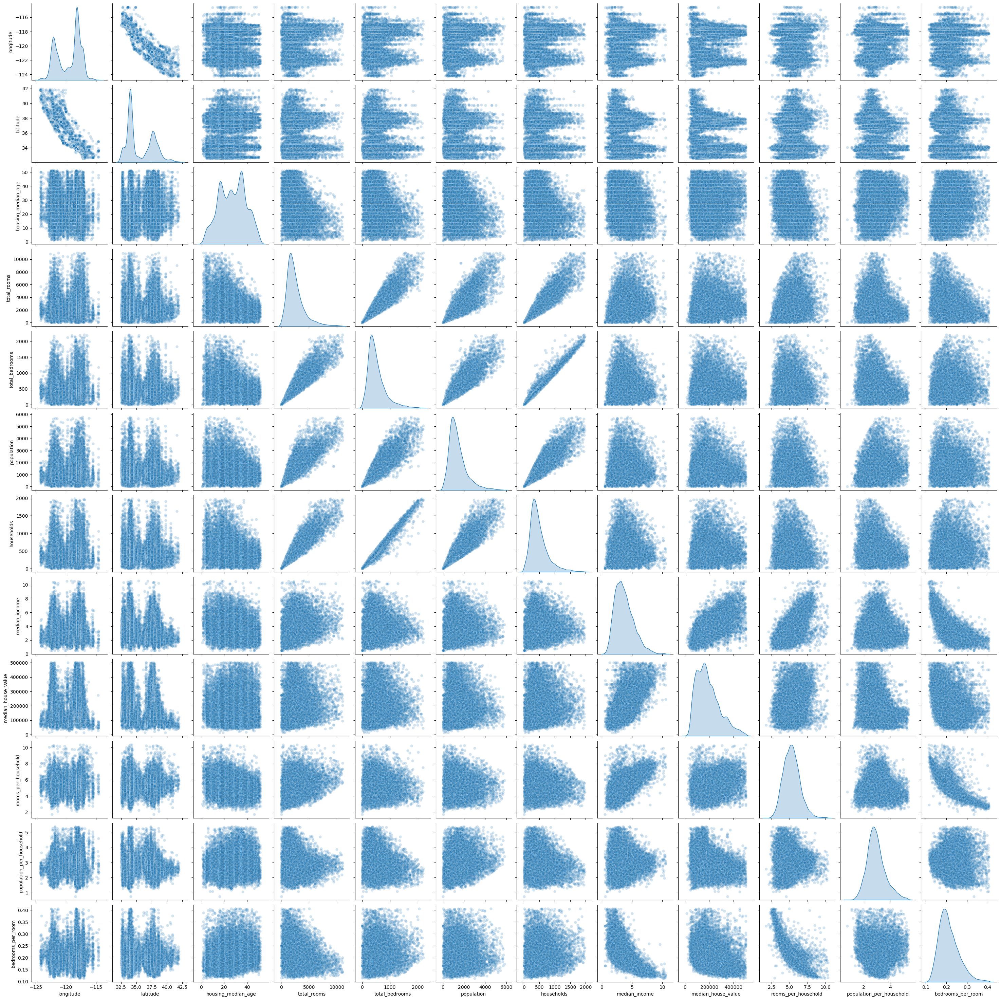

In [24]:
sns.pairplot(df_clean, diag_kind="kde", plot_kws=dict(alpha=SCATTER_ALPHA))

Nota-se:
- diminuição na assimetria de algumas colunas
- Os dados ficaram menos “espalhados”, ou seja, menos outliers
- Relações lineares ficaram mais visíveis (Ex.: total_rooms vs population)
- Menos “linhas artificiais” extremas

Ou seja, conseguimos uma melhor leitura geral dos dados

#### Boxplots do novo dataframe (df_clean)

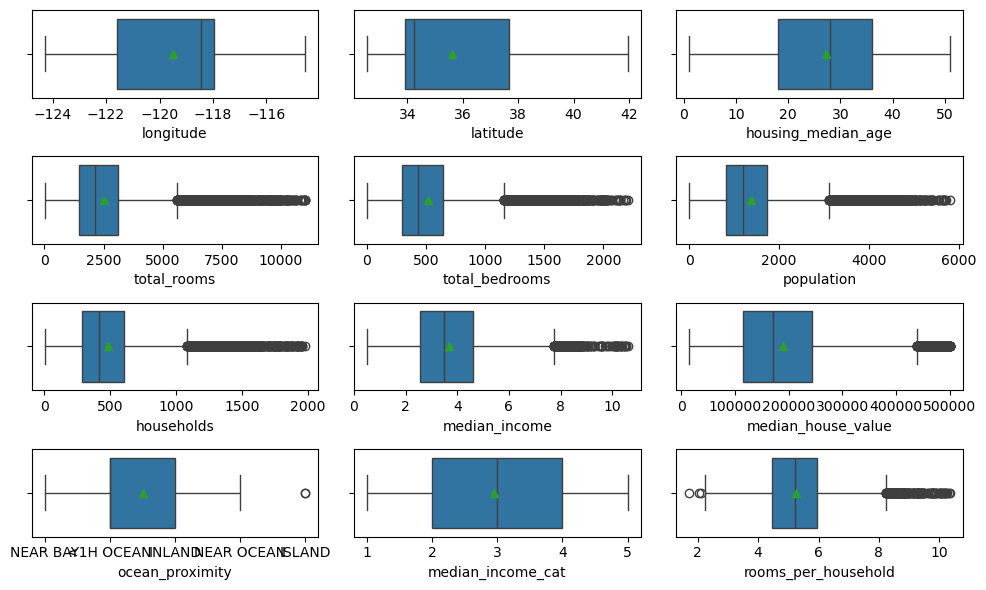

In [25]:
fig, axs = plt.subplots(4, 3, figsize=(10, 6))

for ax, coluna in zip(axs.flatten(), df_clean.columns):
    sns.boxplot(data=df_clean, x=coluna, ax=ax, showmeans=True)

plt.tight_layout()

plt.show()

Notamos uma melhoria nos Boxplots, principalmente em relação aos outliers, que apesar de ainda existirem, diminuíram consideravelmente.

#### Mapa de calor com correlação do novo dataframe (df_clean)

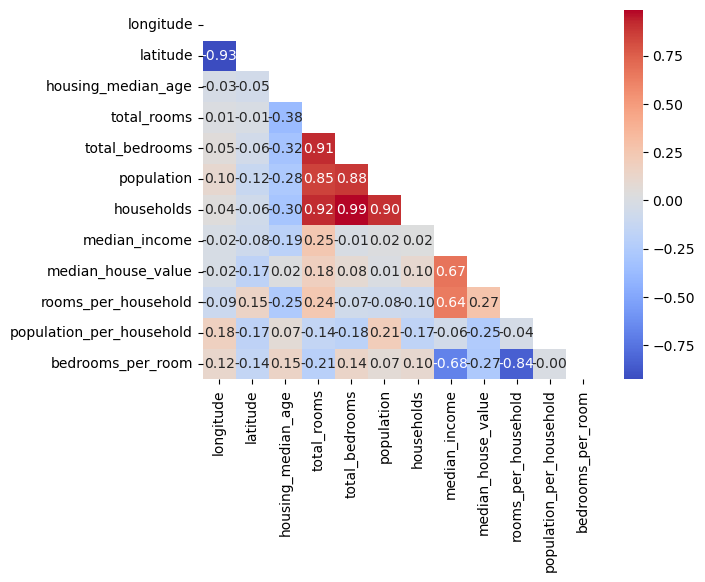

In [26]:
matriz = np.triu(df.select_dtypes("number").corr())

fig, ax = plt.subplots()

sns.heatmap(data=df_clean.select_dtypes("number").corr(), cmap=PALETTE, annot=True, fmt=".2f", mask=matriz, ax=ax)

plt.show()

In [27]:
df_clean["ocean_proximity"].value_counts()

ocean_proximity
<1H OCEAN     7889
INLAND        5935
NEAR OCEAN    2224
NEAR BAY      1516
ISLAND           2
Name: count, dtype: int64

In [28]:
df_clean = df_clean.loc[df_clean["ocean_proximity"] != "ISLAND"]

df_clean["ocean_proximity"].value_counts()

ocean_proximity
<1H OCEAN     7889
INLAND        5935
NEAR OCEAN    2224
NEAR BAY      1516
Name: count, dtype: int64

Faz sentido eliminar a categoria **Island**, visto que a mesma possui apenas 2 amostras e isso não vai ajudar o modelo a aprender.

In [29]:
df_clean["ocean_proximity"] = df_clean["ocean_proximity"].astype("category")

In [30]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17564 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float64 
 1   latitude                  17564 non-null  float64 
 2   housing_median_age        17564 non-null  float64 
 3   total_rooms               17564 non-null  float64 
 4   total_bedrooms            17564 non-null  float64 
 5   population                17564 non-null  float64 
 6   households                17564 non-null  float64 
 7   median_income             17564 non-null  float64 
 8   median_house_value        17564 non-null  float64 
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  category
 11  rooms_per_household       17564 non-null  float64 
 12  population_per_household  17564 non-null  float64 
 13  bedrooms_per_room         17564 non-null  float64 


Para liberar um pouco da memória, vamos fazer um downcast das colunas inteiras e ponto flutuante

In [31]:
inteiros = []

for coluna in df_clean.select_dtypes("number").columns:
    if df_clean[coluna].apply(float.is_integer).all():
        inteiros.append(coluna)

inteiros

['housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_house_value']

In [32]:
ponto_flutuante = df_clean.select_dtypes("number").columns.difference(inteiros)

ponto_flutuante

Index(['bedrooms_per_room', 'latitude', 'longitude', 'median_income',
       'population_per_household', 'rooms_per_household'],
      dtype='object')

In [33]:
df_clean[inteiros] = df_clean[inteiros].apply(pd.to_numeric, downcast="integer")
df_clean[ponto_flutuante] = df_clean[ponto_flutuante].apply(pd.to_numeric, downcast="integer")

In [34]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17564 entries, 0 to 20639
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   longitude                 17564 non-null  float64 
 1   latitude                  17564 non-null  float64 
 2   housing_median_age        17564 non-null  int8    
 3   total_rooms               17564 non-null  int16   
 4   total_bedrooms            17564 non-null  int16   
 5   population                17564 non-null  int16   
 6   households                17564 non-null  int16   
 7   median_income             17564 non-null  float64 
 8   median_house_value        17564 non-null  int32   
 9   ocean_proximity           17564 non-null  category
 10  median_income_cat         17564 non-null  category
 11  rooms_per_household       17564 non-null  float64 
 12  population_per_household  17564 non-null  float64 
 13  bedrooms_per_room         17564 non-null  float64 


#### Salvando o dataframe limpo no formato parquet, para ser usado posteriormente

In [35]:
df_clean.to_parquet(DADOS_LIMPOS, index=False)